In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score
from sklearn.metrics import davies_bouldin_score

In [2]:
%config InlineBackend.figure_format = 'retina'
import warnings
warnings.simplefilter("ignore")

## Aglomerativo PCA

In [3]:
PCA_ds = pd.read_csv('data_PCA.csv',sep=',')
PCA_ds.head()

,col1,col2,col3,col4,col5,col6
0,4.986336,-0.161519,2.445158,-0.177979,1.085071,-0.429372
1,-2.874168,0.022697,-1.530797,-1.401975,1.746937,0.577904
2,2.615763,-0.731417,-0.263984,-0.040425,-0.668800,0.539707
3,-2.654568,-1.455872,-0.398069,1.295974,0.315622,0.877846
4,-0.656015,0.177868,-0.141113,1.653062,0.259336,-0.936212


In [4]:
data = pd.read_csv('data_transformada_escalada.csv',sep=',')
data.head()

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,-0.893586,0.287105,-0.822754,-0.929699,0.310353,0.977660,1.552041,1.690293,2.453472,1.483713,...,2.503607,-0.555814,0.692181,1.527721,1.018352,1.676245,-1.349603,-1.264598,-1.758359,-1.581139
1,-0.893586,-0.260882,1.040021,0.908097,-0.380813,-0.872618,-0.637461,-0.718230,-0.651004,-0.634019,...,-0.571340,-1.171160,-0.132545,-1.189011,1.274785,-0.963297,-1.349603,1.404572,0.449070,0.632456
2,-0.893586,0.913196,-0.822754,-0.929699,-0.795514,0.357935,0.570540,-0.178542,1.339513,-0.147184,...,-0.229679,1.290224,-0.544908,-0.206048,0.334530,0.280110,0.740959,-1.264598,-0.654644,-1.581139
3,-0.893586,-1.176114,1.040021,-0.929699,-0.795514,-0.872618,-0.561961,-0.655787,-0.504911,-0.585335,...,-0.913000,-0.555814,0.279818,-1.060584,-1.289547,-0.920135,0.740959,0.069987,0.449070,0.632456
4,0.571657,0.294307,1.040021,-0.929699,1.554453,-0.392257,0.419540,-0.218684,0.152508,-0.001133,...,0.111982,0.059532,-0.132545,-0.951915,-1.033114,-0.307562,0.740959,0.069987,0.449070,0.632456


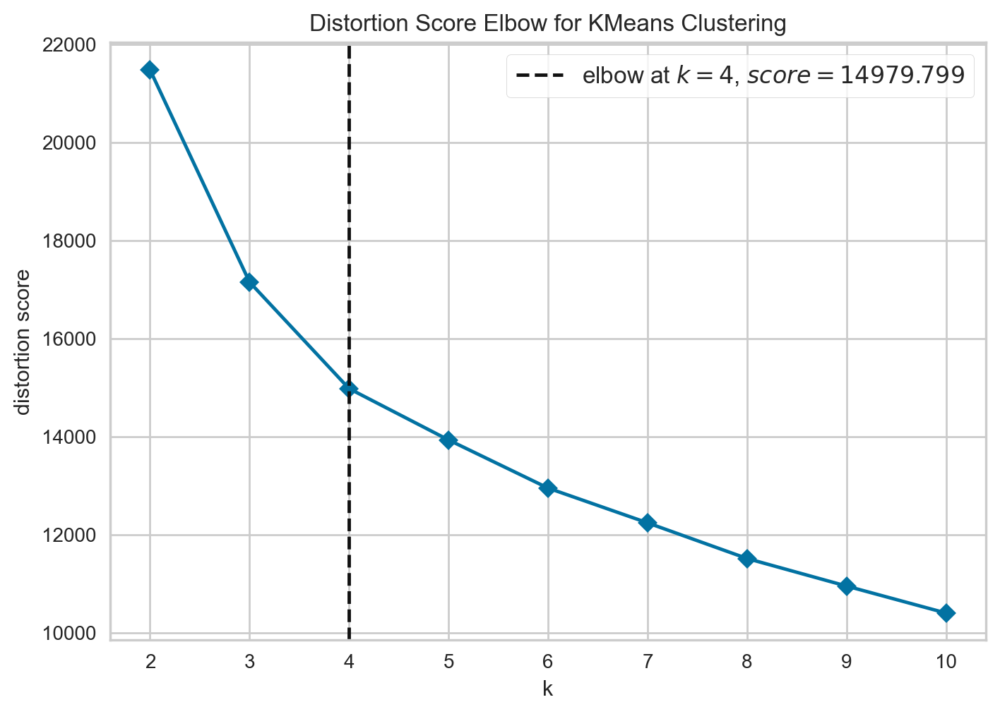

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [5]:
modelo = KMeans(n_clusters=2, random_state=42, n_init=10)
codo = KElbowVisualizer(modelo, k=10, timings=False)
codo.fit(PCA_ds)
codo.show()

In [6]:
AC = AgglomerativeClustering(n_clusters=4)
predicciones = AC.fit_predict(PCA_ds)
PCA_ds["Clusters"] = predicciones
data["Clusters"]= predicciones

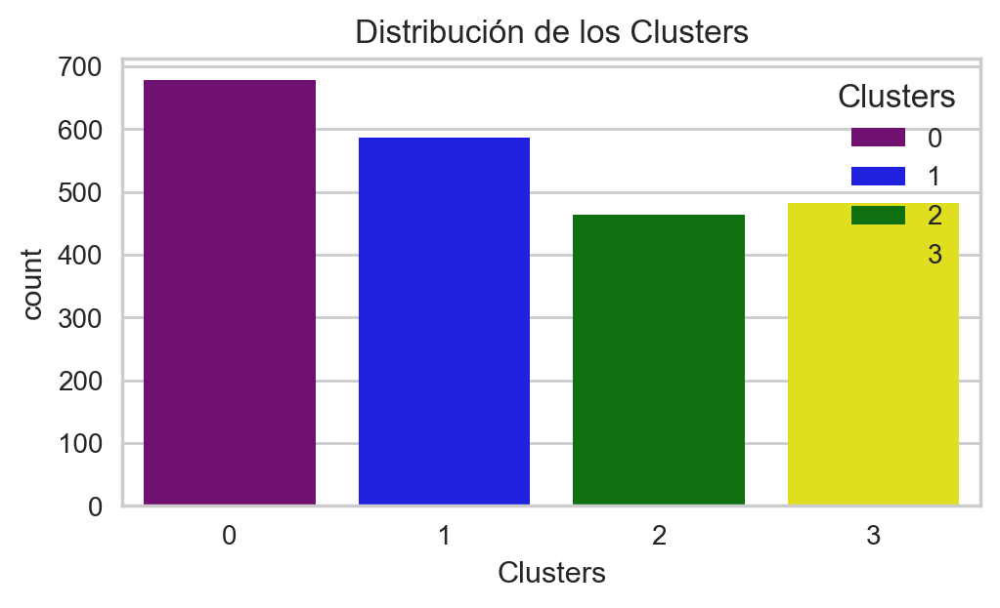

In [7]:
plt.figure(figsize=(5,3),layout="constrained")  
pl = sns.countplot(x=data["Clusters"],hue=data["Clusters"],palette=['Purple','Blue','Green','Yellow'])
pl.set_title("Distribución de los Clusters")
plt.show()

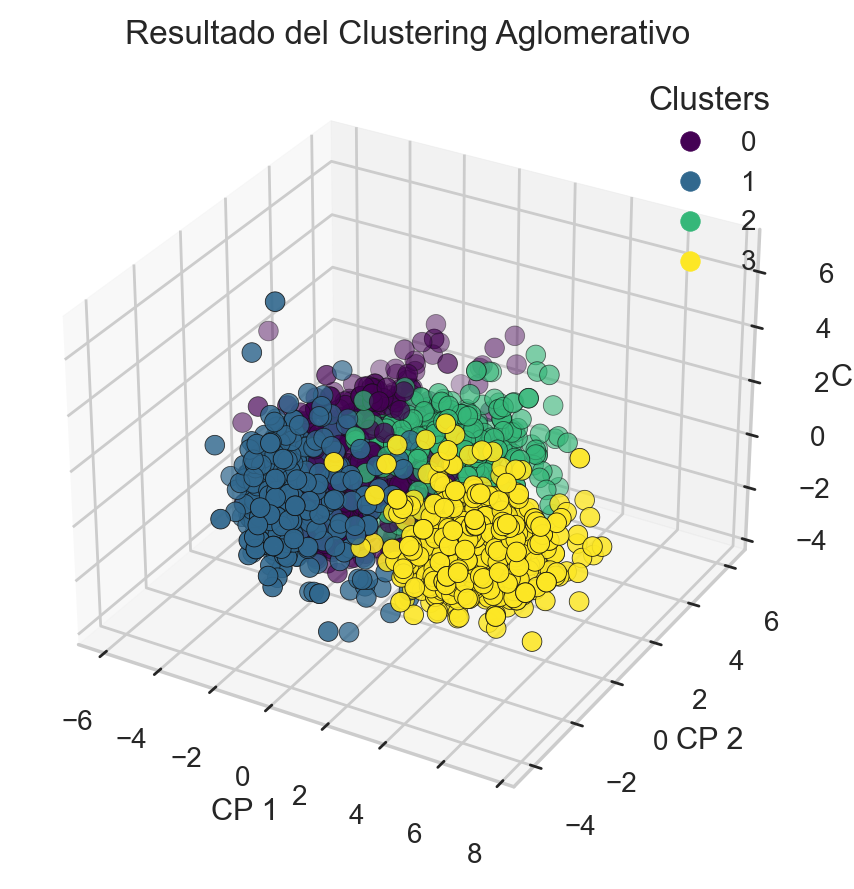

In [8]:
fig = plt.figure(figsize=(5, 8))
ax = fig.add_subplot(111, projection='3d')
scatter = ax.scatter(PCA_ds['col1'], PCA_ds['col2'], PCA_ds['col3'],
                     c=PCA_ds['Clusters'], cmap='viridis', edgecolor='k', s=50)

ax.set_title('Resultado del Clustering Aglomerativo')
ax.set_xlabel('CP 1')
ax.set_ylabel('CP 2')
ax.set_zlabel('CP 3')
ax.legend(*scatter.legend_elements(), title='Clusters')

plt.show()

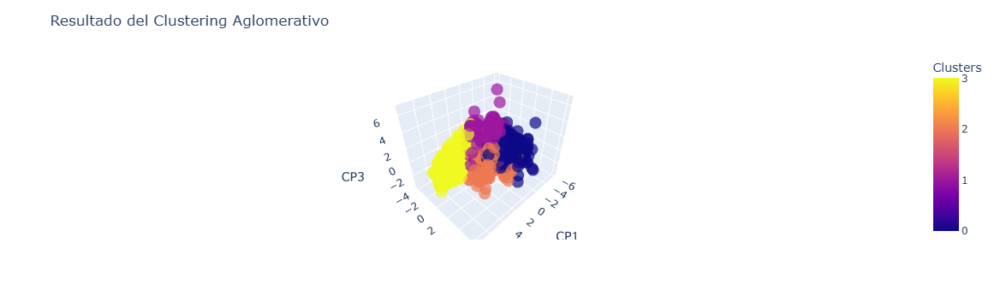

In [9]:
import plotly.express as px
fig=px.scatter_3d(PCA_ds,x="col1",y="col2",z="col3",color='Clusters',size_max=8,opacity=0.7)
fig.update_layout(title="Resultado del Clustering Aglomerativo",
                 scene=dict(xaxis_title='CP1',yaxis_title='CP2',zaxis_title='CP3',))
fig.show()

In [10]:
analisis_cluster = data.groupby('Clusters').describe()
for col in analisis_cluster.columns.levels[0]:
    print("Análisis de cluster para {}:".format(col))
    print(analisis_cluster[col])
    print("--------------------------------------------------------")

Análisis de cluster para Education:
          count      mean       std       min       25%       50%       75%  \
Clusters                                                                      
0         678.0  0.011925  0.949119 -0.893586 -0.893586  0.571657  0.571657   
1         587.0  0.149807  1.148999 -0.893586 -0.893586  0.571657  0.571657   
2         464.0 -0.138860  0.887582 -0.893586 -0.893586 -0.893586  0.571657   
3         483.0 -0.065405  0.954862 -0.893586 -0.893586 -0.893586  0.571657   

             max  
Clusters          
0         2.0369  
1         2.0369  
2         2.0369  
3         2.0369  
--------------------------------------------------------
Análisis de cluster para Income:
          count      mean       std       min       25%       50%       75%  \
Clusters                                                                      
0         678.0 -0.294783  0.673325 -2.227251 -0.719671 -0.316684  0.105016   
1         587.0 -0.986462  0.630159 -2.333791 -1

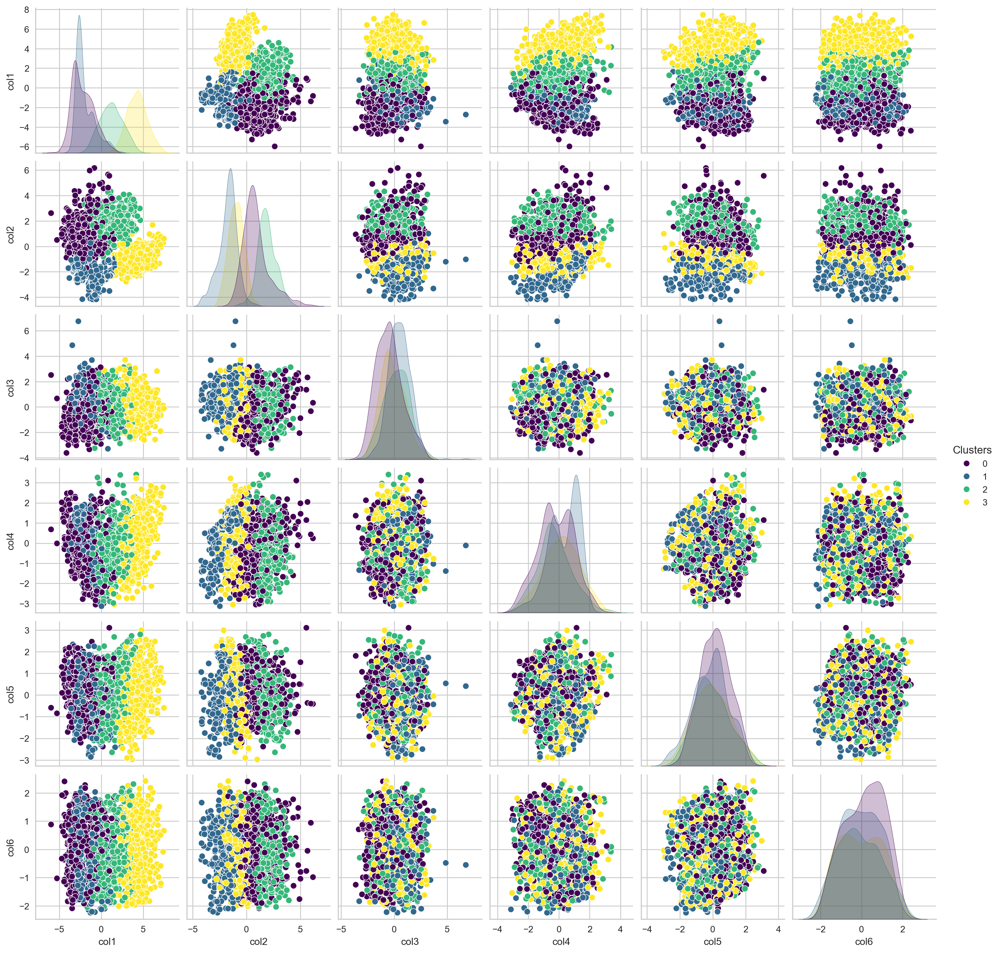

In [11]:
sns.pairplot(PCA_ds, hue='Clusters', palette='viridis', markers='o')
plt.show()

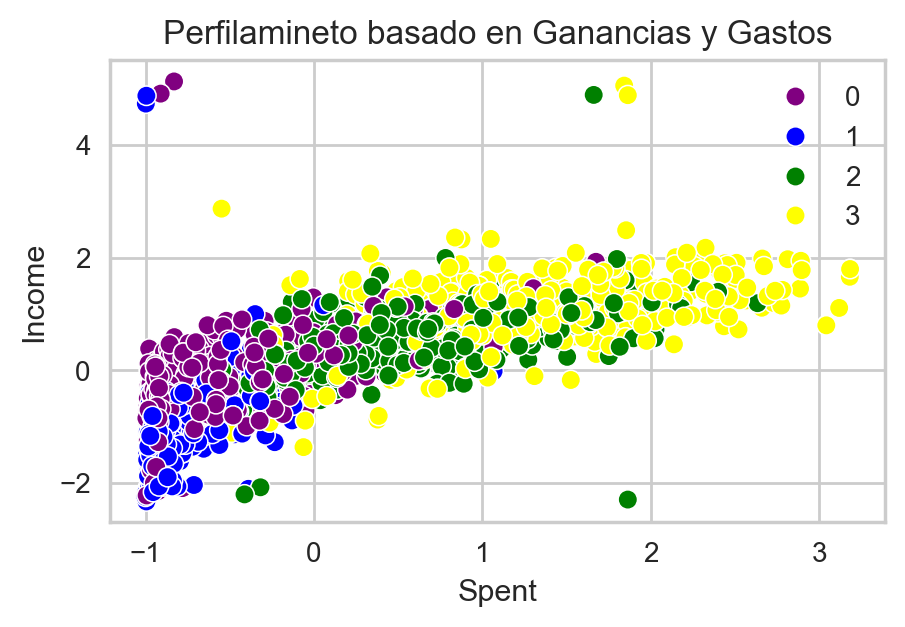

In [12]:
plt.figure(figsize=(5,3)) 
pl = sns.scatterplot(data = data,x=data["Spent"], y=data["Income"],hue=data["Clusters"],
                     palette=['Purple','Blue','Green','Yellow'])
pl.set_title("Perfilamineto basado en Ganancias y Gastos")
plt.legend()
plt.show()

In [13]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2212 entries, 0 to 2211
Data columns (total 24 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Education            2212 non-null   float64
 1   Income               2212 non-null   float64
 2   Kidhome              2212 non-null   float64
 3   Teenhome             2212 non-null   float64
 4   Recency              2212 non-null   float64
 5   Wines                2212 non-null   float64
 6   Fruits               2212 non-null   float64
 7   Meat                 2212 non-null   float64
 8   Fish                 2212 non-null   float64
 9   Sweets               2212 non-null   float64
 10  Gold                 2212 non-null   float64
 11  NumDealsPurchases    2212 non-null   float64
 12  NumWebPurchases      2212 non-null   float64
 13  NumCatalogPurchases  2212 non-null   float64
 14  NumStorePurchases    2212 non-null   float64
 15  NumWebVisitsMonth    2212 non-null   f

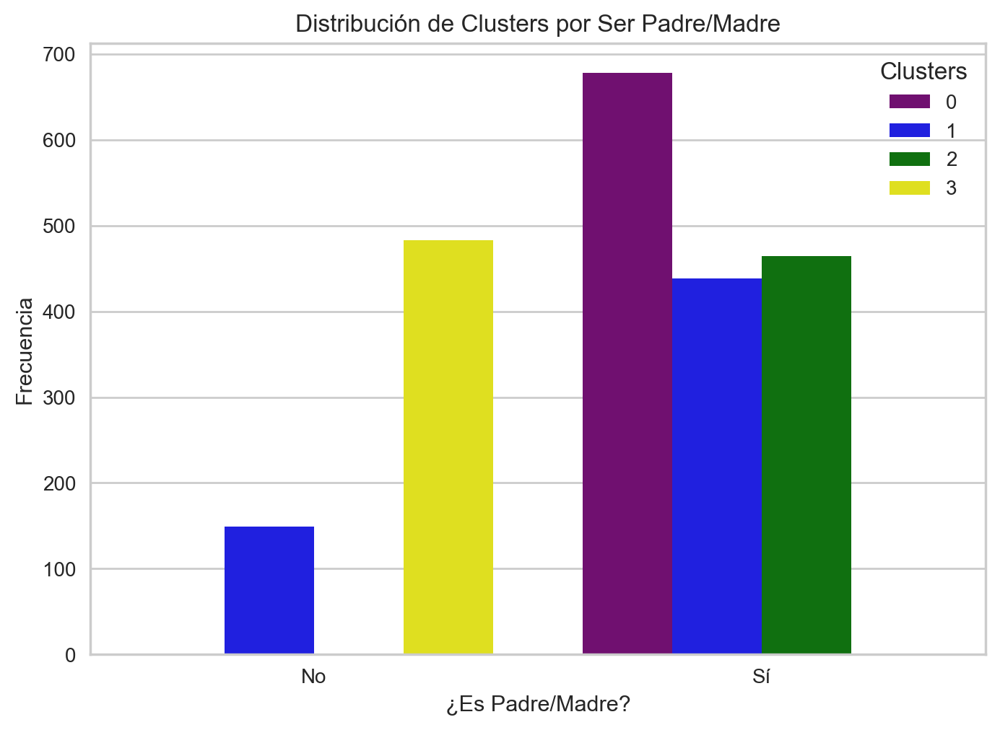

In [14]:
pl = sns.countplot(x=data["Is_Parent"], hue=data["Clusters"], palette=['Purple', 'Blue', 'Green', 'Yellow'])
plt.title("Distribución de Clusters por Ser Padre/Madre")
plt.xlabel("¿Es Padre/Madre?")
plt.ylabel("Frecuencia")
plt.xticks([0, 1], ["No", "Sí"])
plt.show()

<Figure size 500x300 with 0 Axes>

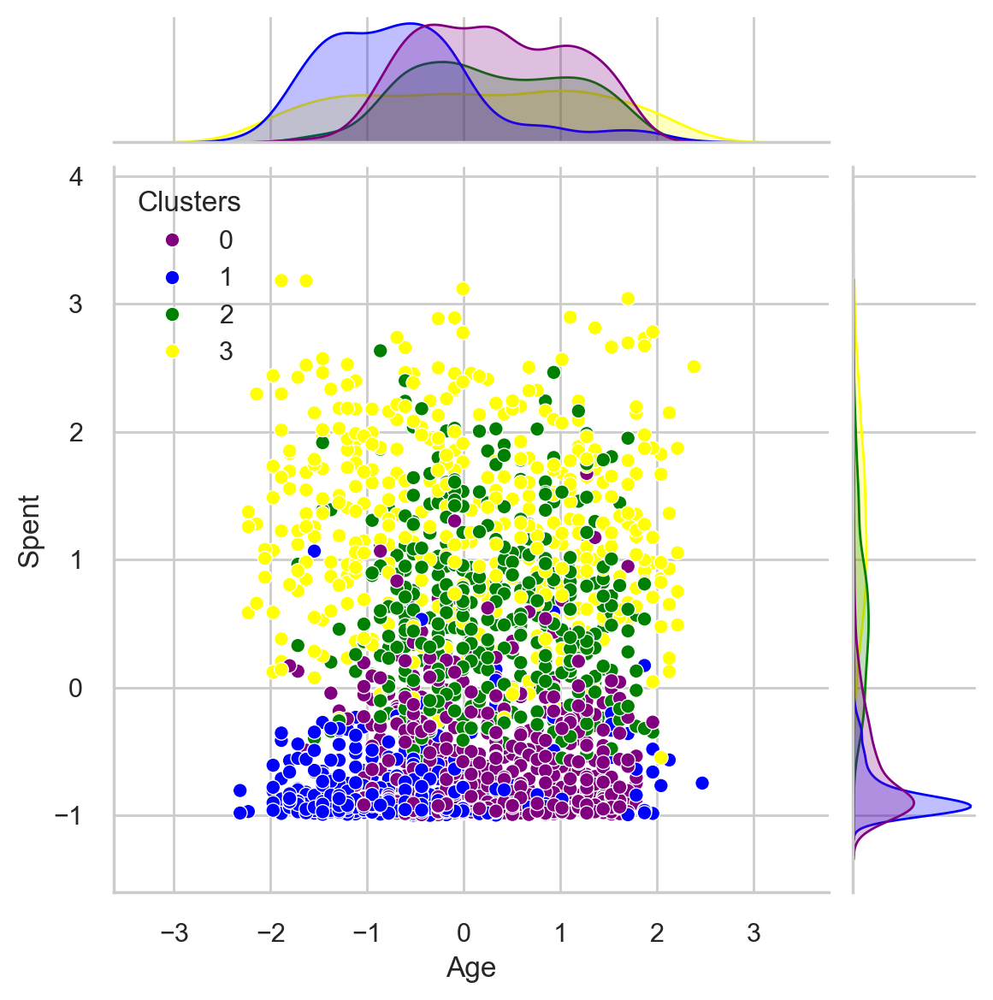

In [15]:
plt.figure(figsize=(5,3)) 
sns.set(style="whitegrid")
g = sns.jointplot(x="Age", y="Spent", data=data,hue="Clusters", kind="scatter",
                 palette=['Purple','Blue','Green','Yellow'])
plt.show()

## Visualizar diferencias entre clusters

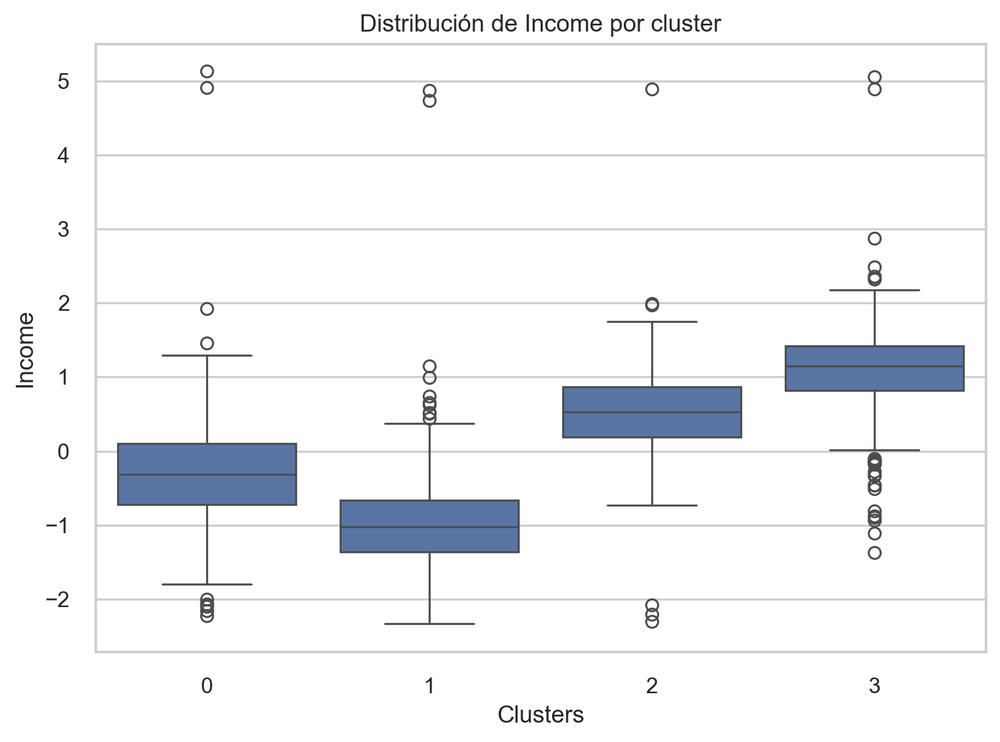

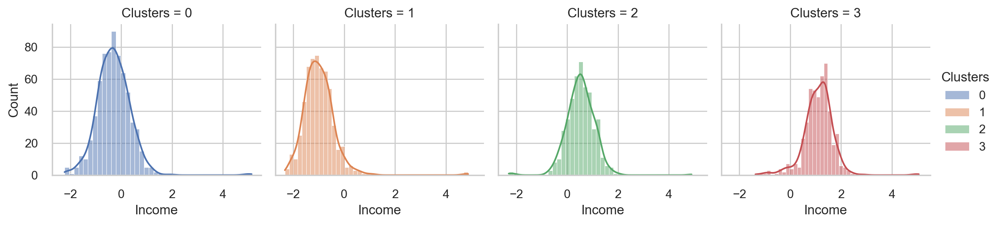

In [16]:
sns.boxplot(x='Clusters', y='Income', data=data)
plt.title('Distribución de Income por cluster')
plt.show()

g = sns.FacetGrid(data, col="Clusters", hue="Clusters", sharex=True, sharey=True)
g.map(sns.histplot, "Income", kde=True).add_legend()
plt.show()

In [17]:
score = silhouette_score(PCA_ds, AC.labels_)
print(f"Coeficiente de Silueta={score}")

Coeficiente de Silueta=0.25381865774298334


In [18]:
dbi_agglo = davies_bouldin_score(PCA_ds, modelo.labels_)
print(f"Davies-Bouldin Index - Aglomerativo: {dbi_agglo}")

Davies-Bouldin Index - Aglomerativo: 1.5805825236130404


## Aglomerativo (TSNE)

In [19]:
TSNE_ds = pd.read_csv('data_reduccion_TSNE.csv',sep=',')
TSNE_ds.head()

,col1,col2
0,30.620274,-7.712108
1,-48.222248,12.715313
2,28.431597,-21.590351
3,-50.654060,-22.825716
4,-36.348347,-20.864601


In [20]:
data = pd.read_csv('data_transformada_escalada.csv',sep=',')
data.head()

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,-0.893586,0.287105,-0.822754,-0.929699,0.310353,0.977660,1.552041,1.690293,2.453472,1.483713,...,2.503607,-0.555814,0.692181,1.527721,1.018352,1.676245,-1.349603,-1.264598,-1.758359,-1.581139
1,-0.893586,-0.260882,1.040021,0.908097,-0.380813,-0.872618,-0.637461,-0.718230,-0.651004,-0.634019,...,-0.571340,-1.171160,-0.132545,-1.189011,1.274785,-0.963297,-1.349603,1.404572,0.449070,0.632456
2,-0.893586,0.913196,-0.822754,-0.929699,-0.795514,0.357935,0.570540,-0.178542,1.339513,-0.147184,...,-0.229679,1.290224,-0.544908,-0.206048,0.334530,0.280110,0.740959,-1.264598,-0.654644,-1.581139
3,-0.893586,-1.176114,1.040021,-0.929699,-0.795514,-0.872618,-0.561961,-0.655787,-0.504911,-0.585335,...,-0.913000,-0.555814,0.279818,-1.060584,-1.289547,-0.920135,0.740959,0.069987,0.449070,0.632456
4,0.571657,0.294307,1.040021,-0.929699,1.554453,-0.392257,0.419540,-0.218684,0.152508,-0.001133,...,0.111982,0.059532,-0.132545,-0.951915,-1.033114,-0.307562,0.740959,0.069987,0.449070,0.632456


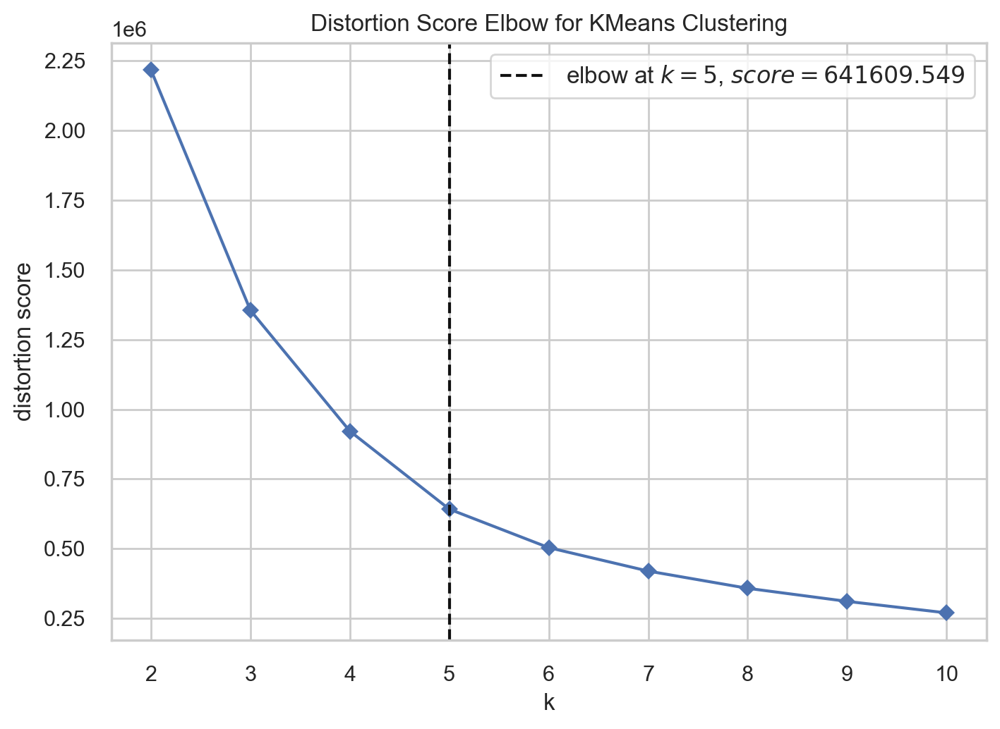

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [21]:
modelo = KMeans(n_clusters=2, random_state=42, n_init=10)
codo = KElbowVisualizer(modelo, k=10, timings=False)
codo.fit(TSNE_ds)
codo.show()

In [22]:
AC = AgglomerativeClustering(n_clusters=5)
predicciones = AC.fit_predict(TSNE_ds)
TSNE_ds["Clusters"] = predicciones
data["Clusters"]= predicciones

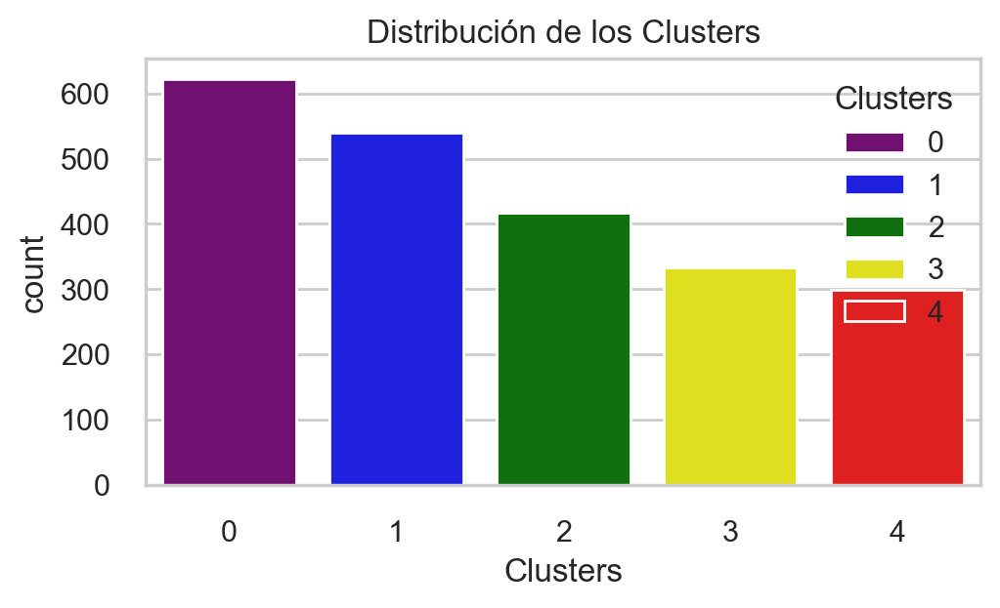

In [23]:
plt.figure(figsize=(5,3),layout="constrained")  
pl = sns.countplot(x=data["Clusters"],hue=data["Clusters"],palette=['Purple','Blue','Green','Yellow','Red'])
pl.set_title("Distribución de los Clusters")
plt.show()

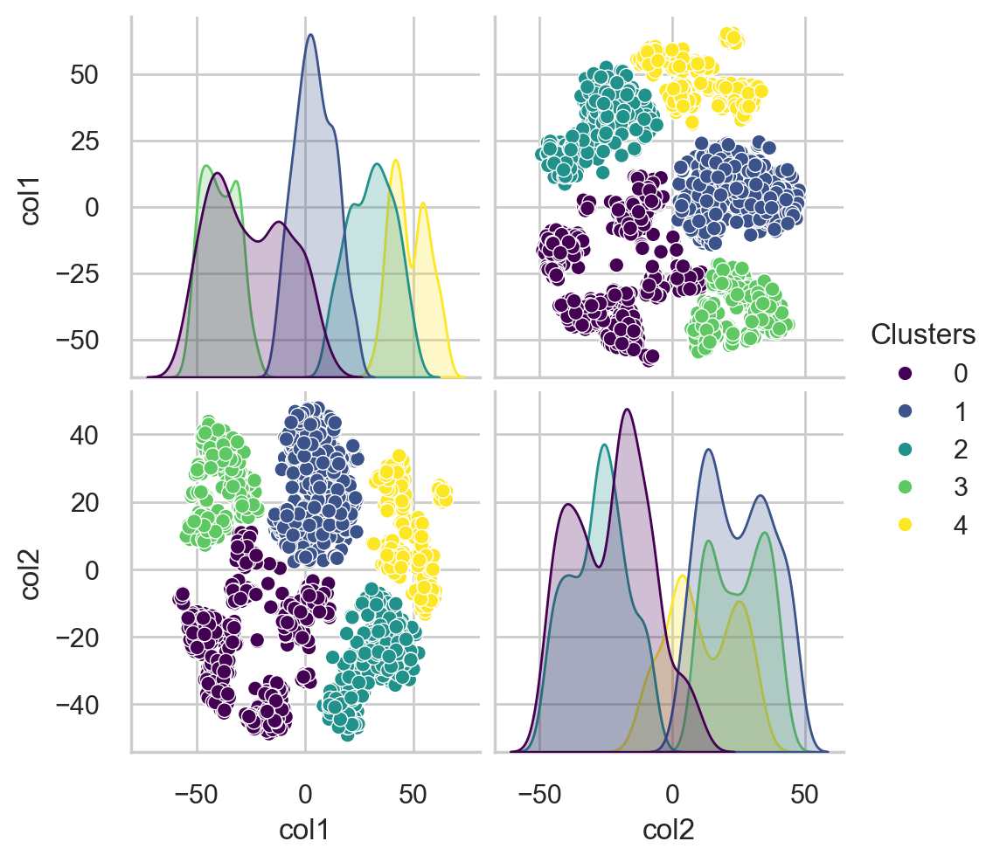

In [27]:
sns.pairplot(TSNE_ds, hue='Clusters', palette='viridis', markers='o')
plt.show()

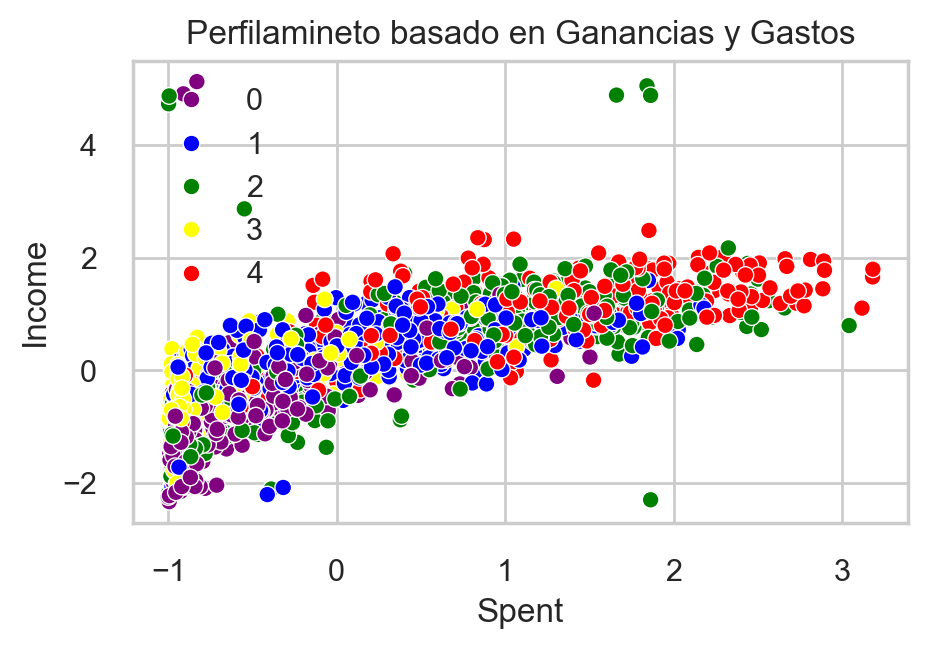

In [28]:
plt.figure(figsize=(5,3)) 
pl = sns.scatterplot(data = data,x=data["Spent"], y=data["Income"],hue=data["Clusters"],
                     palette=['Purple','Blue','Green','Yellow','Red'])
pl.set_title("Perfilamineto basado en Ganancias y Gastos")
plt.legend()
plt.show()

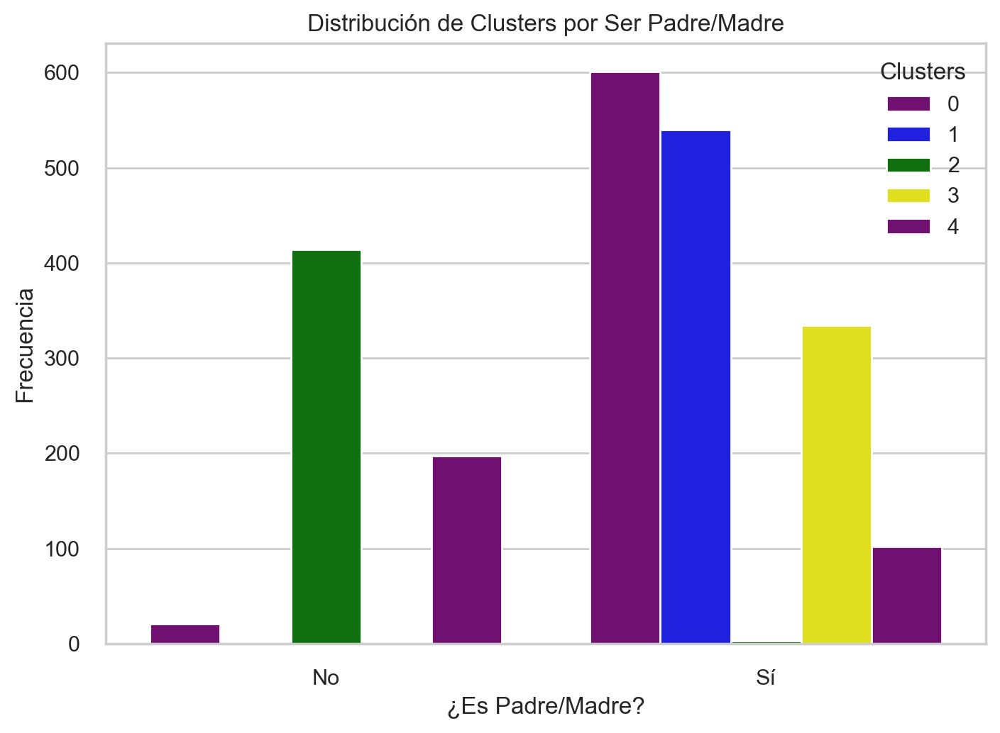

In [29]:
pl = sns.countplot(x=data["Is_Parent"], hue=data["Clusters"], palette=['Purple', 'Blue', 'Green', 'Yellow'])
plt.title("Distribución de Clusters por Ser Padre/Madre")
plt.xlabel("¿Es Padre/Madre?")
plt.ylabel("Frecuencia")
plt.xticks([0, 1], ["No", "Sí"])
plt.show()

<Figure size 500x300 with 0 Axes>

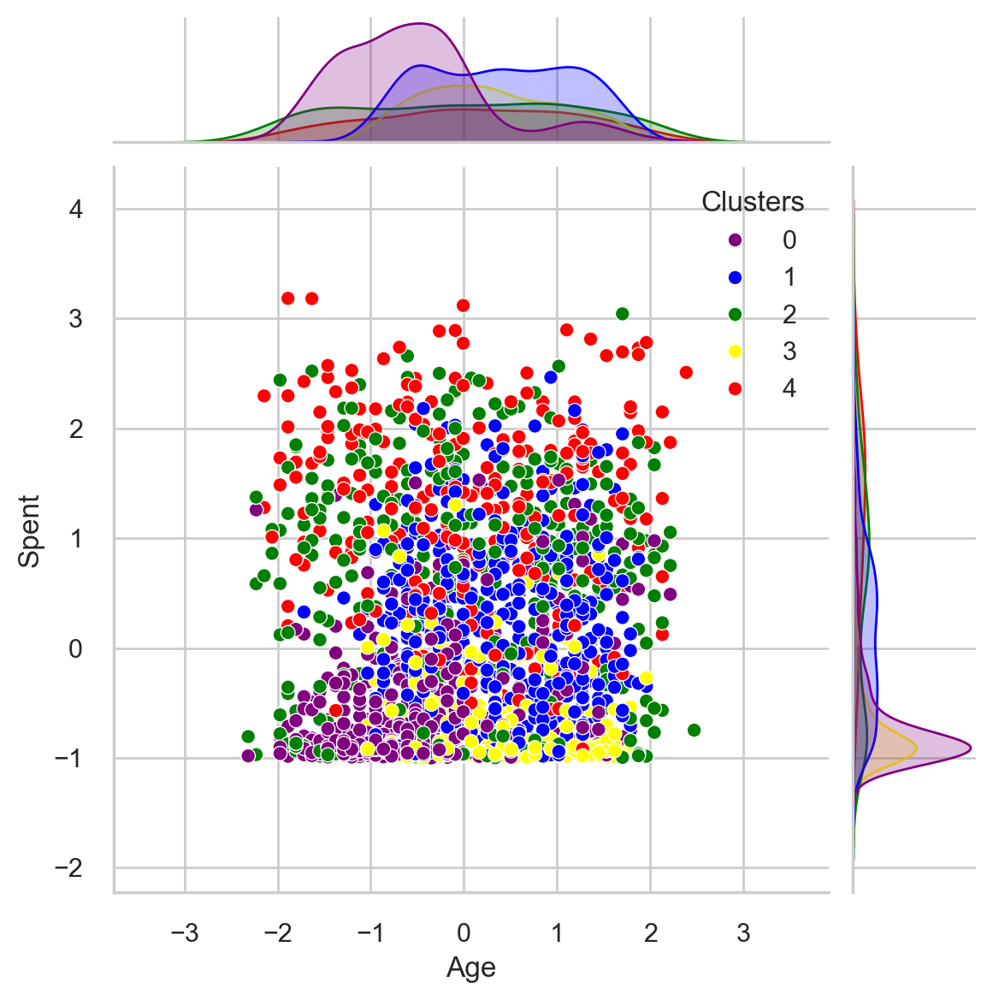

In [31]:
plt.figure(figsize=(5,3)) 
sns.set(style="whitegrid")
g = sns.jointplot(x="Age", y="Spent", data=data,hue="Clusters", kind="scatter",
                 palette=['Purple','Blue','Green','Yellow','Red'])
plt.show()

## Visualizar diferencias entre clusters

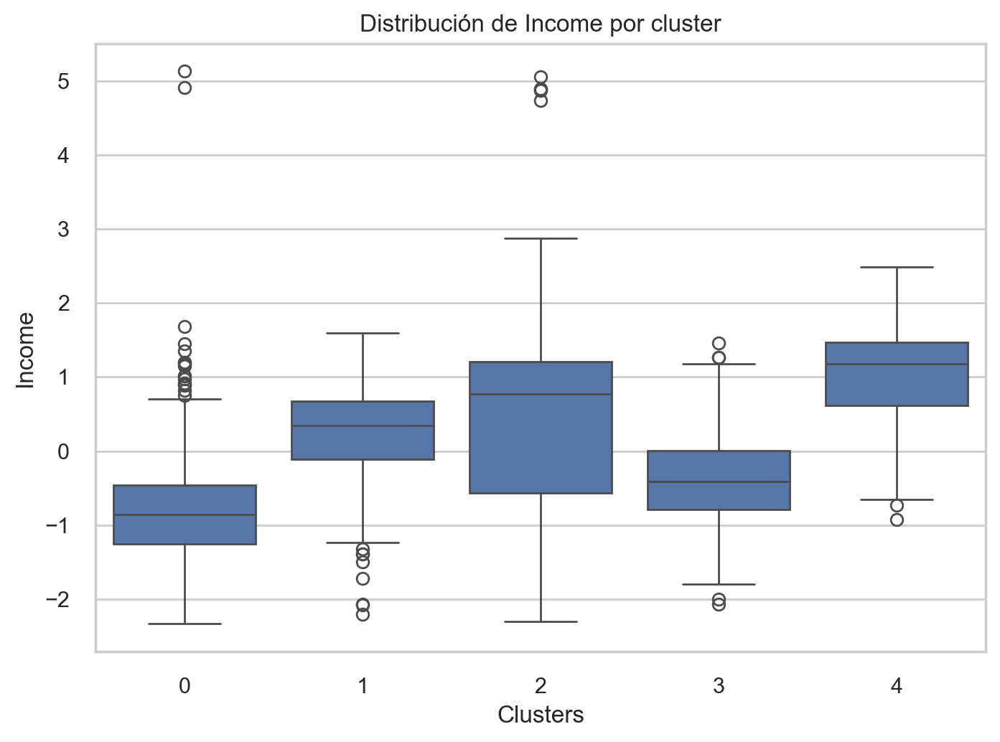

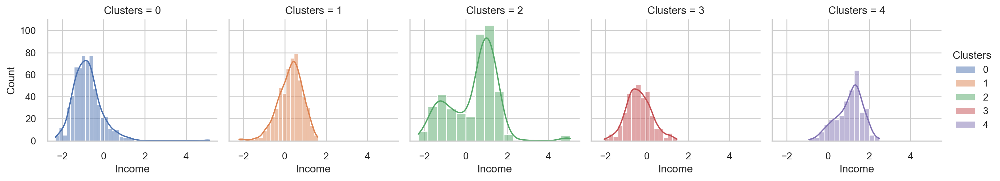

In [32]:
sns.boxplot(x='Clusters', y='Income', data=data)
plt.title('Distribución de Income por cluster')
plt.show()

g = sns.FacetGrid(data, col="Clusters", hue="Clusters", sharex=True, sharey=True)
g.map(sns.histplot, "Income", kde=True).add_legend()
plt.show()

In [33]:
score = silhouette_score(TSNE_ds, AC.labels_)
print(f"Coeficiente de Silueta={score}")

Coeficiente de Silueta=0.46790696902459145


In [34]:
dbi_agglo = davies_bouldin_score(PCA_ds, modelo.labels_)
print(f"Davies-Bouldin Index - Aglomerativo: {dbi_agglo}")

Davies-Bouldin Index - Aglomerativo: 2.759876218746922


## Aglomerativo (UMAP)

In [35]:
UMAP_ds = pd.read_csv('data_reduccion_UMAP.csv',sep=',')
UMAP_ds.head()

,col1,col2
0,7.947662,12.219968
1,11.329375,-0.086987
2,5.836195,12.522989
3,6.380645,-6.642157
4,8.008347,-6.492001


In [36]:
data = pd.read_csv('data_transformada_escalada.csv',sep=',')
data.head()

,Education,Income,Kidhome,Teenhome,Recency,Wines,Fruits,Meat,Fish,Sweets,...,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Customer_For,Age,Spent,Living_With,Children,Family_Size,Is_Parent
0,-0.893586,0.287105,-0.822754,-0.929699,0.310353,0.977660,1.552041,1.690293,2.453472,1.483713,...,2.503607,-0.555814,0.692181,1.527721,1.018352,1.676245,-1.349603,-1.264598,-1.758359,-1.581139
1,-0.893586,-0.260882,1.040021,0.908097,-0.380813,-0.872618,-0.637461,-0.718230,-0.651004,-0.634019,...,-0.571340,-1.171160,-0.132545,-1.189011,1.274785,-0.963297,-1.349603,1.404572,0.449070,0.632456
2,-0.893586,0.913196,-0.822754,-0.929699,-0.795514,0.357935,0.570540,-0.178542,1.339513,-0.147184,...,-0.229679,1.290224,-0.544908,-0.206048,0.334530,0.280110,0.740959,-1.264598,-0.654644,-1.581139
3,-0.893586,-1.176114,1.040021,-0.929699,-0.795514,-0.872618,-0.561961,-0.655787,-0.504911,-0.585335,...,-0.913000,-0.555814,0.279818,-1.060584,-1.289547,-0.920135,0.740959,0.069987,0.449070,0.632456
4,0.571657,0.294307,1.040021,-0.929699,1.554453,-0.392257,0.419540,-0.218684,0.152508,-0.001133,...,0.111982,0.059532,-0.132545,-0.951915,-1.033114,-0.307562,0.740959,0.069987,0.449070,0.632456


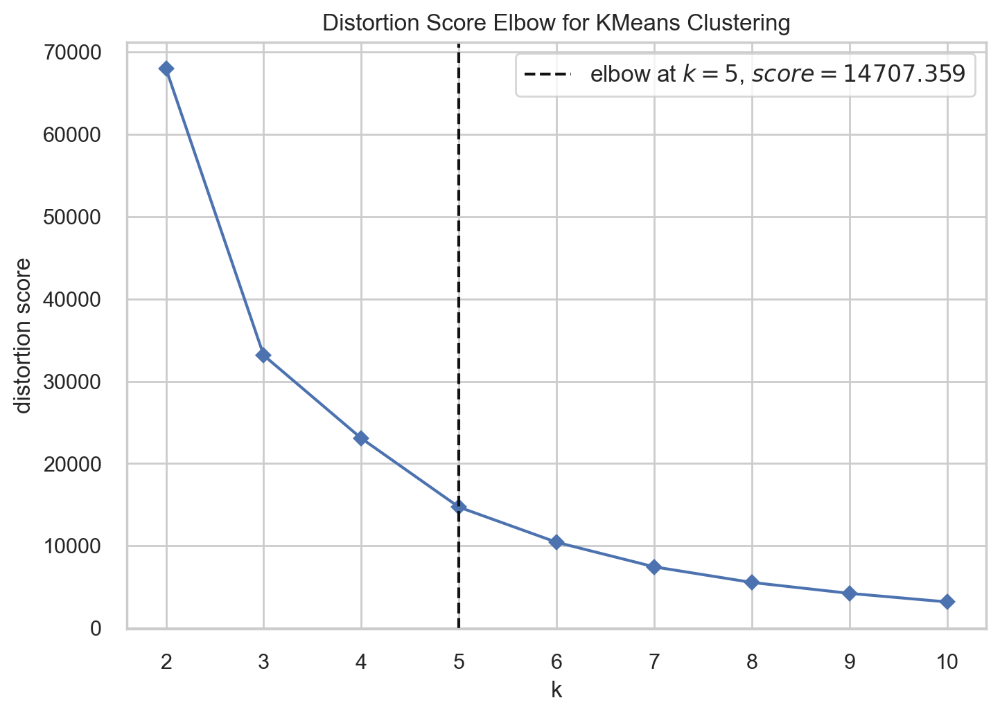

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [39]:
modelo = KMeans(n_clusters=2, random_state=42, n_init=10)
codo = KElbowVisualizer(modelo, k=10, timings=False)
codo.fit(UMAP_ds)
codo.show()

In [40]:
AC = AgglomerativeClustering(n_clusters=5)
predicciones = AC.fit_predict(UMAP_ds)
UMAP_ds["Clusters"] = predicciones
data["Clusters"]= predicciones

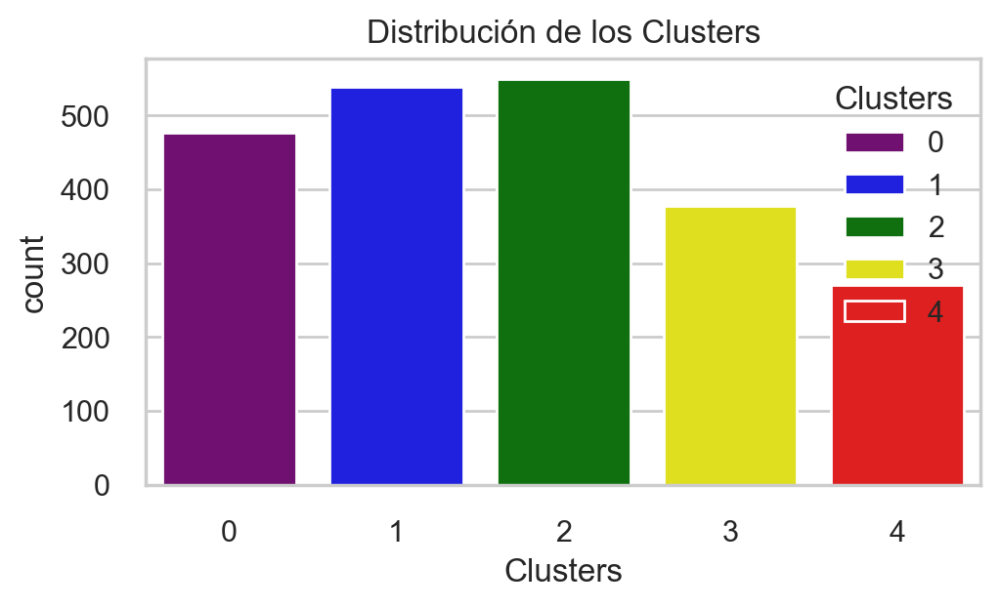

In [41]:
plt.figure(figsize=(5,3),layout="constrained")  
pl = sns.countplot(x=data["Clusters"],hue=data["Clusters"],palette=['Purple','Blue','Green','Yellow','Red'])
pl.set_title("Distribución de los Clusters")
plt.show()

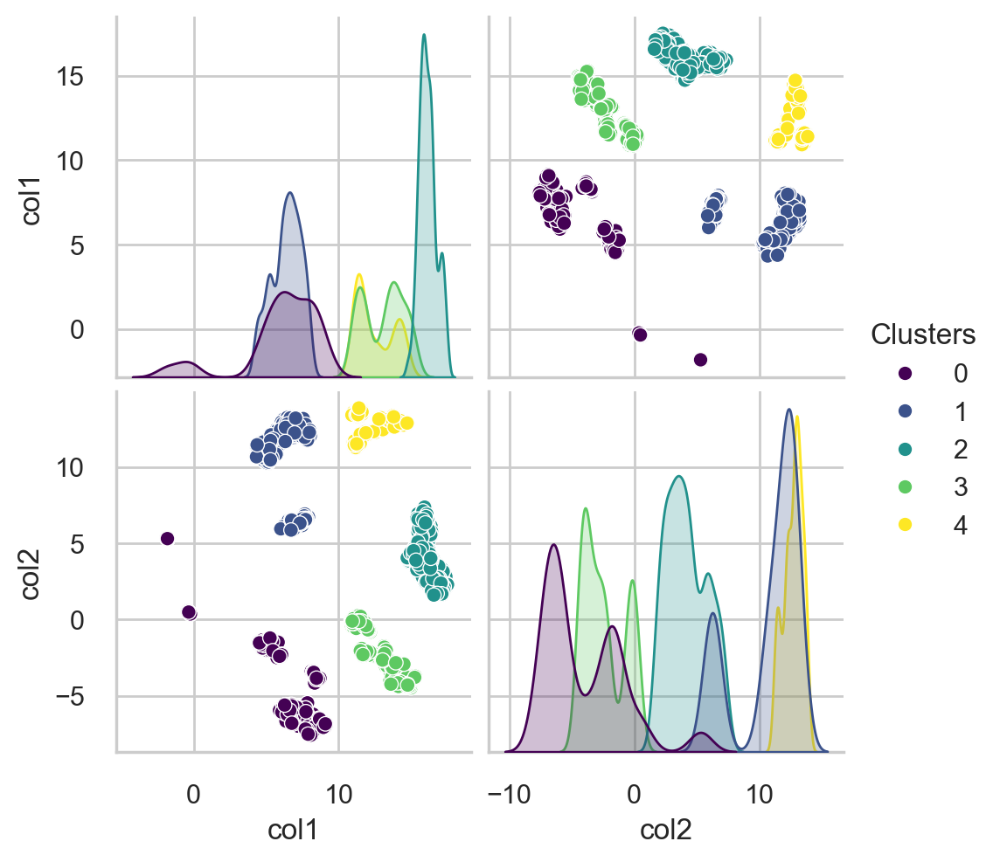

In [42]:
sns.pairplot(UMAP_ds, hue='Clusters', palette='viridis', markers='o')
plt.show()

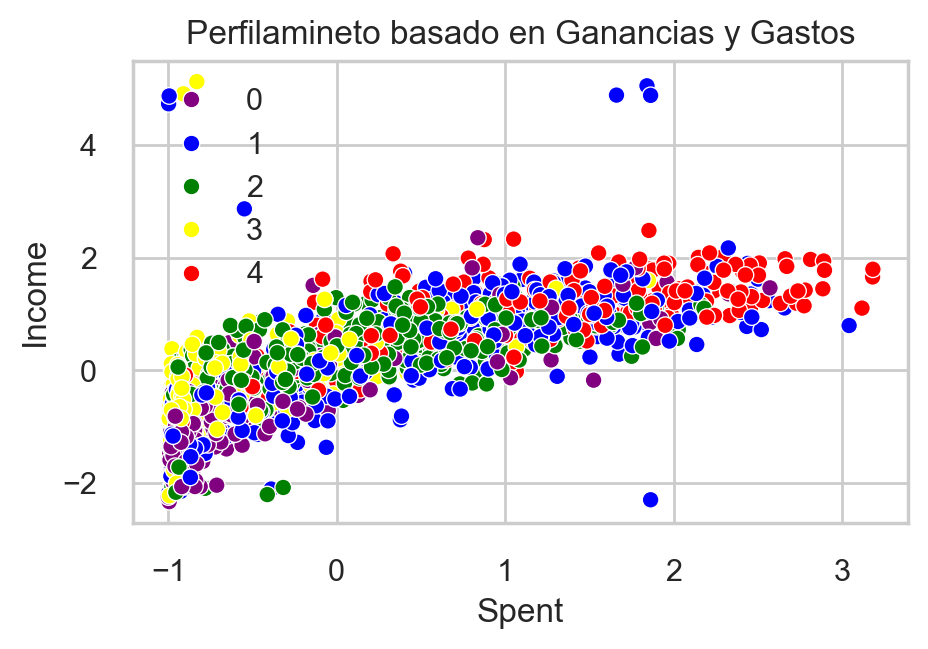

In [43]:
plt.figure(figsize=(5,3)) 
pl = sns.scatterplot(data = data,x=data["Spent"], y=data["Income"],hue=data["Clusters"],
                     palette=['Purple','Blue','Green','Yellow','Red'])
pl.set_title("Perfilamineto basado en Ganancias y Gastos")
plt.legend()
plt.show()

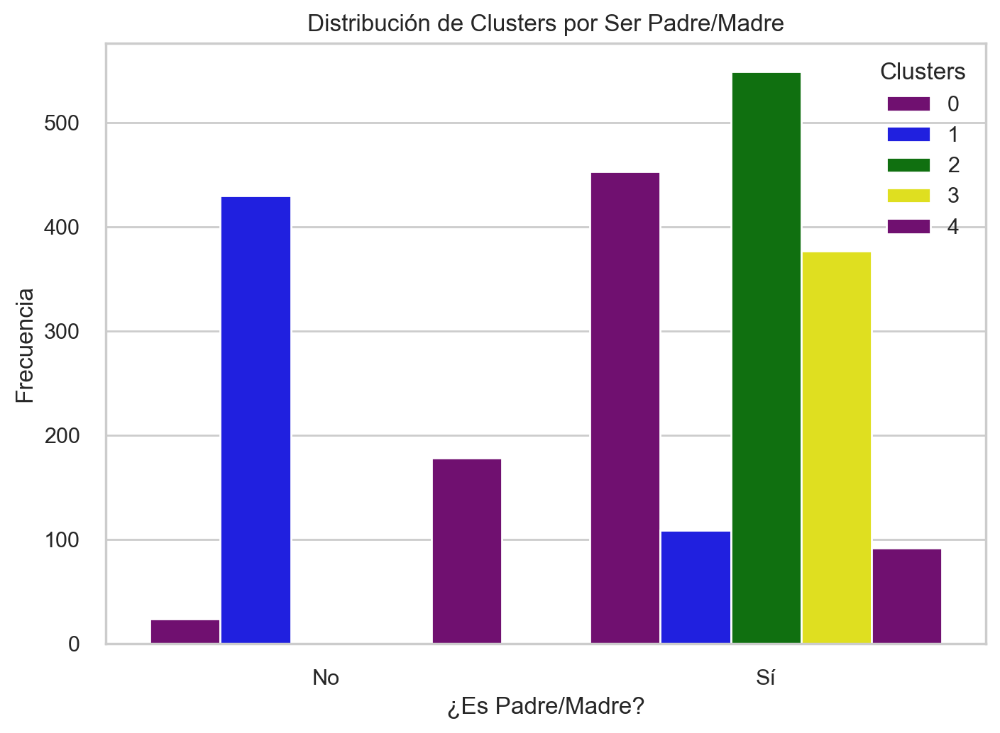

In [44]:
pl = sns.countplot(x=data["Is_Parent"], hue=data["Clusters"], palette=['Purple', 'Blue', 'Green', 'Yellow'])
plt.title("Distribución de Clusters por Ser Padre/Madre")
plt.xlabel("¿Es Padre/Madre?")
plt.ylabel("Frecuencia")
plt.xticks([0, 1], ["No", "Sí"])
plt.show()

<Figure size 500x300 with 0 Axes>

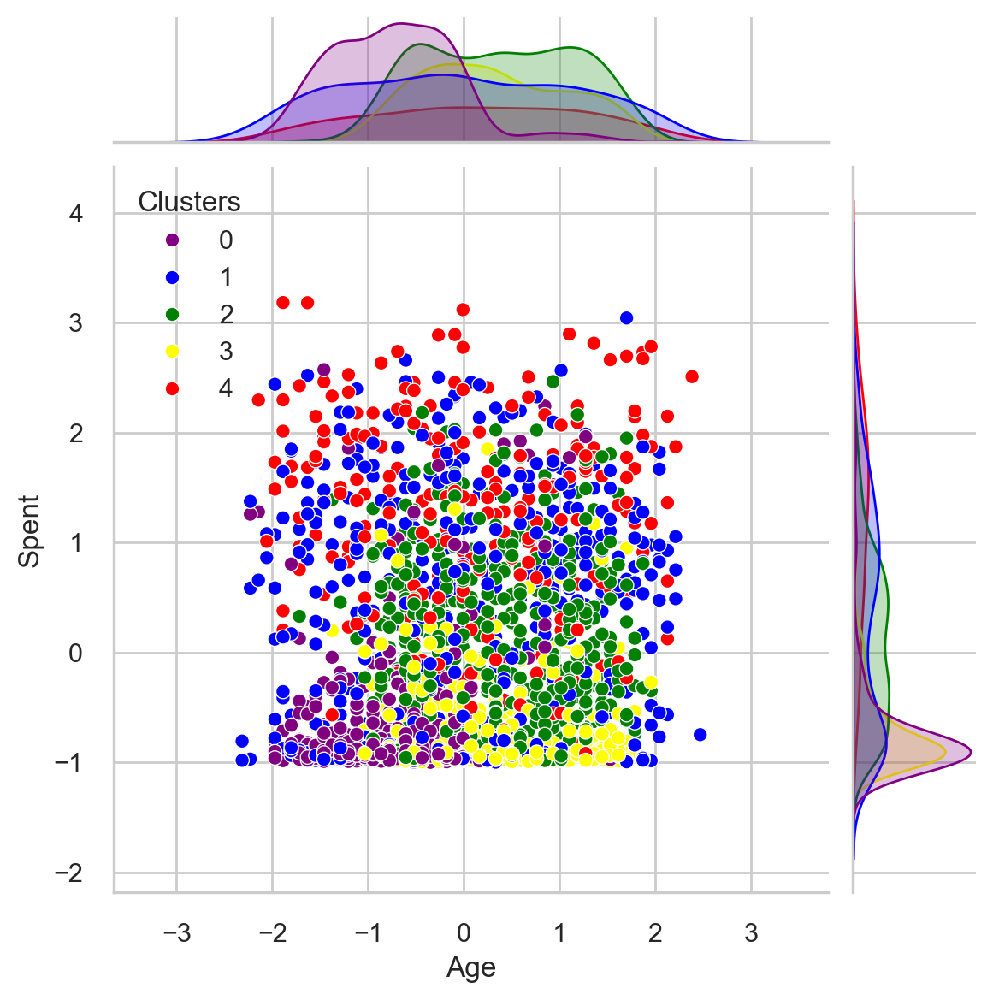

In [45]:
plt.figure(figsize=(5,3)) 
sns.set(style="whitegrid")
g = sns.jointplot(x="Age", y="Spent", data=data,hue="Clusters", kind="scatter",
                 palette=['Purple','Blue','Green','Yellow','Red'])
plt.show()

## Visualizar diferencias entre clusters

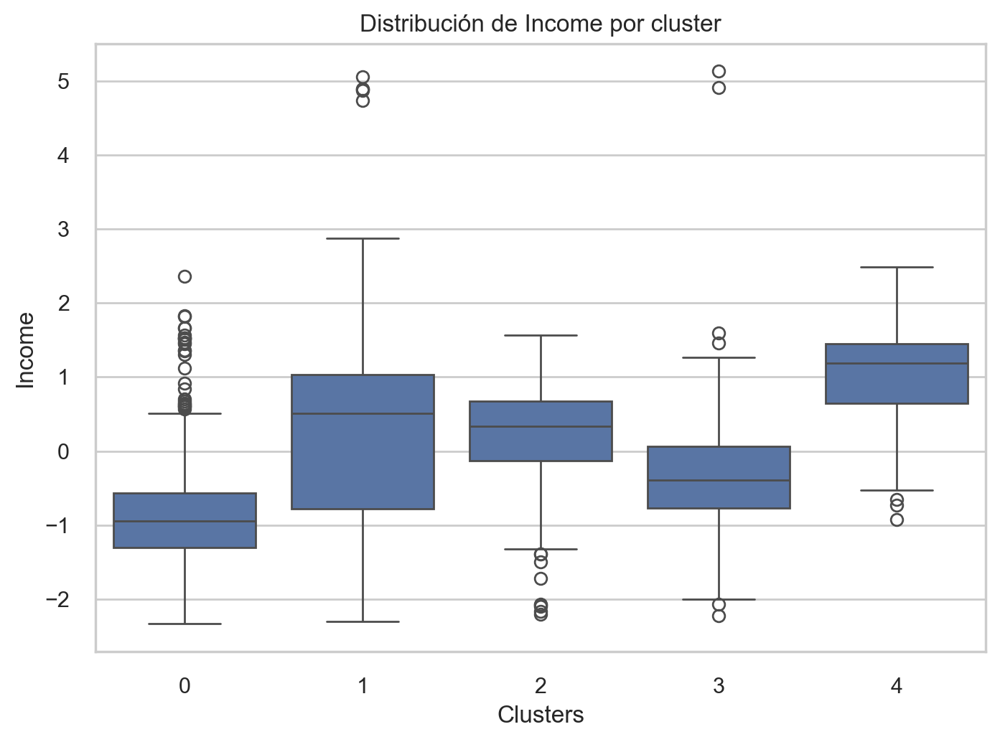

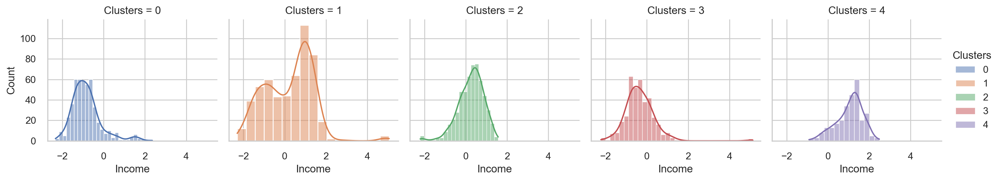

In [46]:
sns.boxplot(x='Clusters', y='Income', data=data)
plt.title('Distribución de Income por cluster')
plt.show()

g = sns.FacetGrid(data, col="Clusters", hue="Clusters", sharex=True, sharey=True)
g.map(sns.histplot, "Income", kde=True).add_legend()
plt.show()

In [47]:
score = silhouette_score(UMAP_ds, AC.labels_)
print(f"Coeficiente de Silueta={score}")

Coeficiente de Silueta=0.62994568098046


In [48]:
dbi_agglo = davies_bouldin_score(UMAP_ds, modelo.labels_)
print(f"Davies-Bouldin Index - Aglomerativo: {dbi_agglo}")

Davies-Bouldin Index - Aglomerativo: 0.445550735998685
